# Import Libraries and Dataset

In [3]:
# Data Manipulation
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data Pre-processing
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew
from scipy.special import boxcox1p
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split
from imblearn.over_sampling import SMOTE

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import plotly.express as px

# Classification
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import pickle

import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv('bank_transactions_data_2.csv')
df

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70,Doctor,81,1,5112.21,2024-11-04 08:08:08
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68,Doctor,141,1,13758.91,2024-11-04 08:09:35
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19,Student,56,1,1122.35,2024-11-04 08:07:04
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26,Student,25,1,8569.06,2024-11-04 08:09:06
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26,Student,198,1,7429.40,2024-11-04 08:06:39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2507,TX002508,AC00297,856.21,2023-04-26 17:09:36,Credit,Colorado Springs,D000625,21.157.41.17,M072,Branch,33,Doctor,109,1,12690.79,2024-11-04 08:11:29
2508,TX002509,AC00322,251.54,2023-03-22 17:36:48,Debit,Tucson,D000410,49.174.157.140,M029,Branch,48,Doctor,177,1,254.75,2024-11-04 08:11:42
2509,TX002510,AC00095,28.63,2023-08-21 17:08:50,Debit,San Diego,D000095,58.1.27.124,M087,Branch,56,Retired,146,1,3382.91,2024-11-04 08:08:39
2510,TX002511,AC00118,185.97,2023-02-24 16:24:46,Debit,Denver,D000634,21.190.11.223,M041,Online,23,Student,19,1,1776.91,2024-11-04 08:12:22


In [5]:
df = df[['TransactionAmount', 'TransactionType', 'Channel', 'CustomerAge', 'CustomerOccupation', 'TransactionDuration', 'LoginAttempts', 'AccountBalance']]
df.head()

,TransactionAmount,TransactionType,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance
0,14.09,Debit,ATM,70,Doctor,81,1,5112.21
1,376.24,Debit,ATM,68,Doctor,141,1,13758.91
2,126.29,Debit,Online,19,Student,56,1,1122.35
3,184.50,Debit,Online,26,Student,25,1,8569.06
4,13.45,Credit,Online,26,Student,198,1,7429.40


# Exploratory Data Analysis (EDA)

## Check Column and Value

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   TransactionAmount    2512 non-null   float64
 1   TransactionType      2512 non-null   object 
 2   Channel              2512 non-null   object 
 3   CustomerAge          2512 non-null   int64  
 4   CustomerOccupation   2512 non-null   object 
 5   TransactionDuration  2512 non-null   int64  
 6   LoginAttempts        2512 non-null   int64  
 7   AccountBalance       2512 non-null   float64
dtypes: float64(2), int64(3), object(3)
memory usage: 157.1+ KB


In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
TransactionAmount,2512.0,297.593778,291.946243,0.26,81.885,211.14,414.5275,1919.11
CustomerAge,2512.0,44.673965,17.792198,18.00,27.000,45.00,59.0000,80.00
TransactionDuration,2512.0,119.643312,69.963757,10.00,63.000,112.50,161.0000,300.00
LoginAttempts,2512.0,1.124602,0.602662,1.00,1.000,1.00,1.0000,5.00
AccountBalance,2512.0,5114.302966,3900.942499,101.25,1504.370,4735.51,7678.8200,14977.99


## Distribution Each Columns

In [11]:
num_col = df.select_dtypes(exclude='object').columns.to_list()
cat_col = df.select_dtypes(exclude='number').columns.to_list()

print(f'Numeric columns: {num_col}')
print(f'Categorycal columns: {cat_col}')

Numeric columns: ['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance']
Categorycal columns: ['TransactionType', 'Channel', 'CustomerOccupation']


### Numerical Columns

<Figure size 600x200 with 0 Axes>

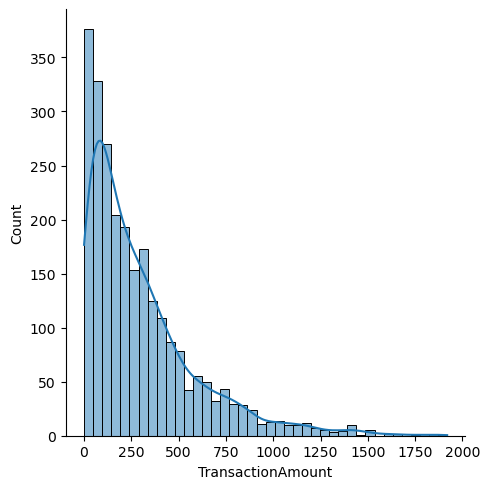

<Figure size 600x200 with 0 Axes>

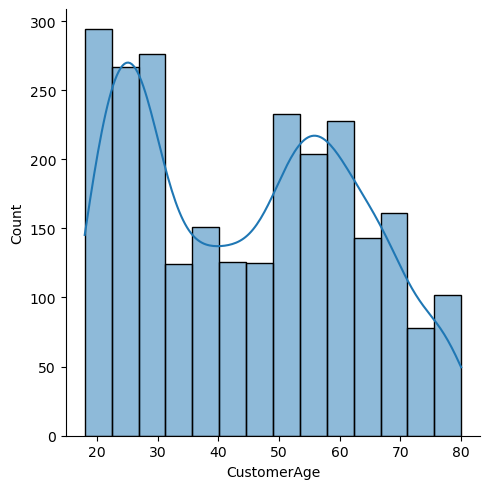

<Figure size 600x200 with 0 Axes>

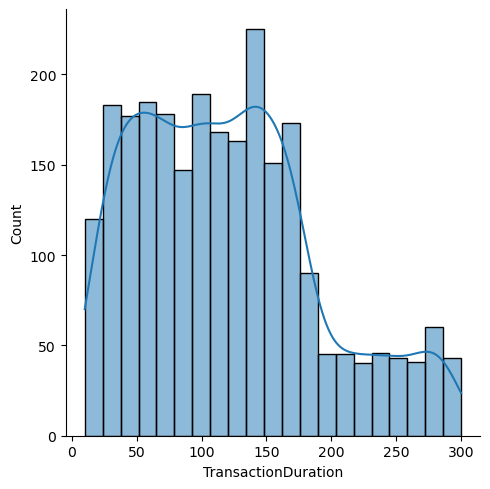

<Figure size 600x200 with 0 Axes>

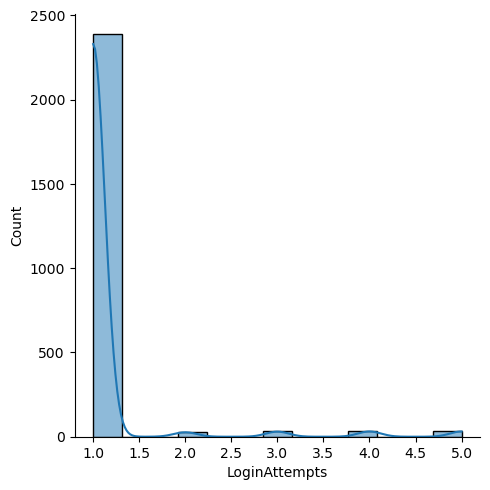

<Figure size 600x200 with 0 Axes>

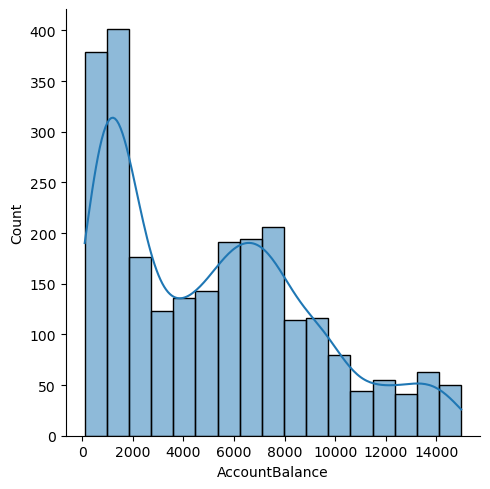

In [13]:
for num in num_col:
    plt.figure(figsize = (6,2))
    sns.displot(data = df, x = num, kde = True)
    plt.show()

### Categorical Columns

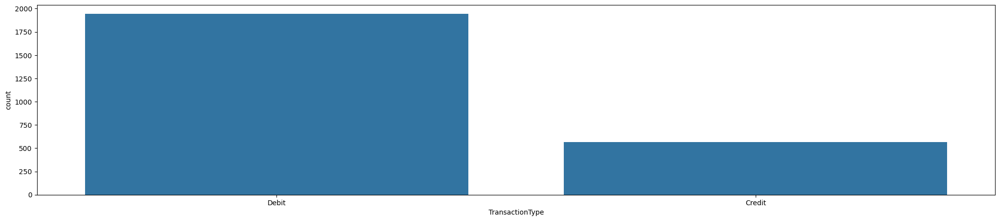

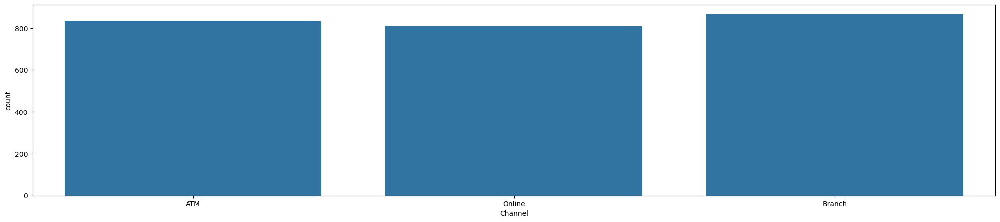

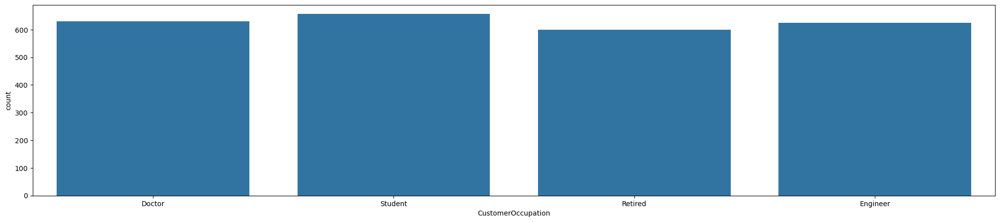

In [15]:
for cat in cat_col:
    plt.figure(figsize = (25,5))
    sns.countplot(data = df, x = cat)
    plt.show()

## Bivariate Analysis

### Between Numerical Columns

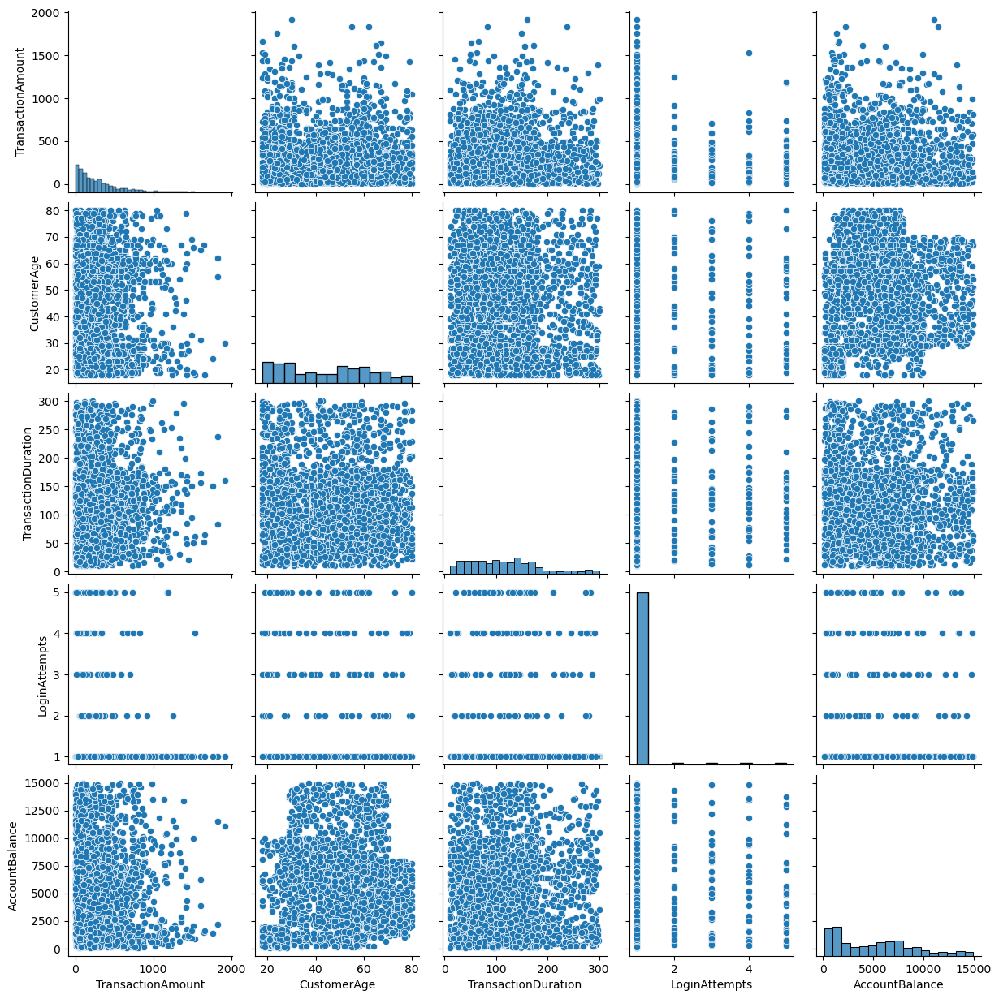

In [18]:
sns.pairplot(df)
plt.show()

### Between Categorical Columns

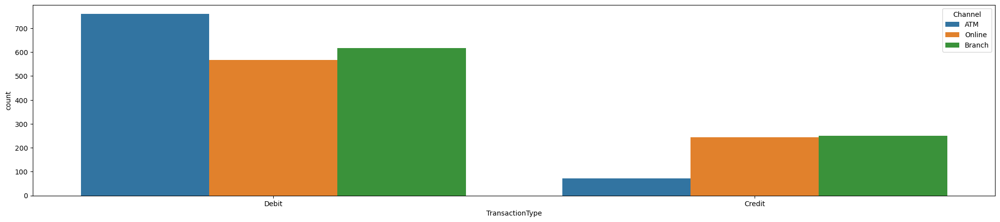

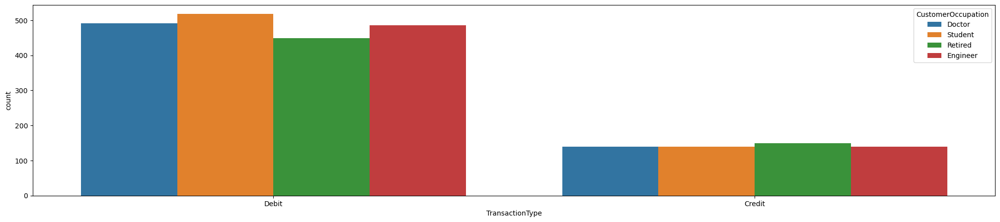

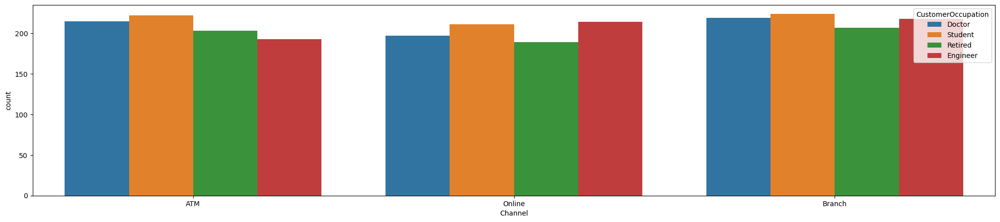

In [20]:
cat_aux = cat_col.copy()

for category1 in cat_col:
    cat_aux.pop(0);
    for category2 in cat_aux:
        if category1 != category2:
            plt.figure(figsize = (25,5))
            sns.countplot(data = df, x = category1, hue = category2, legend='auto')
            plt.show()

### Numerical and Categorical Column

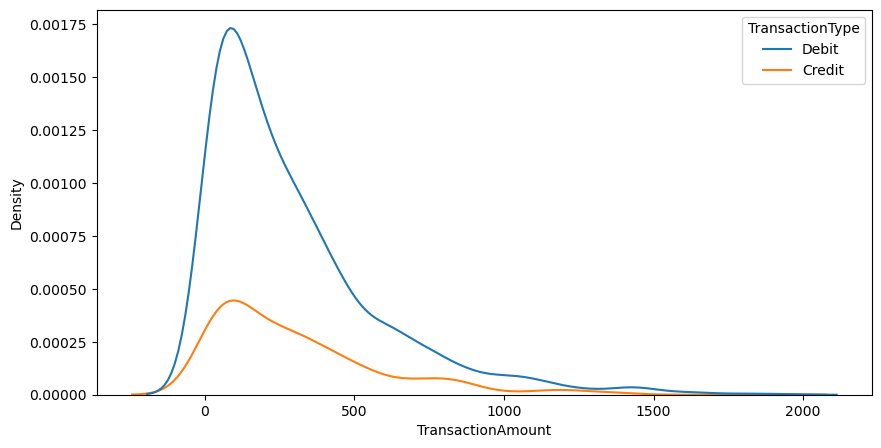

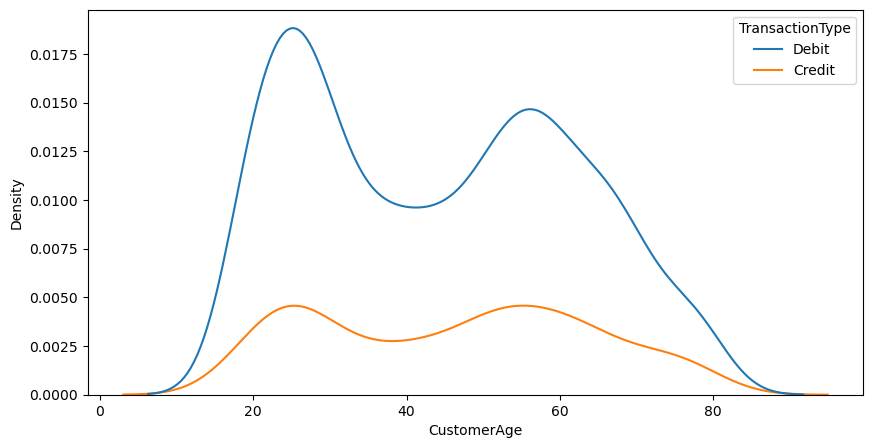

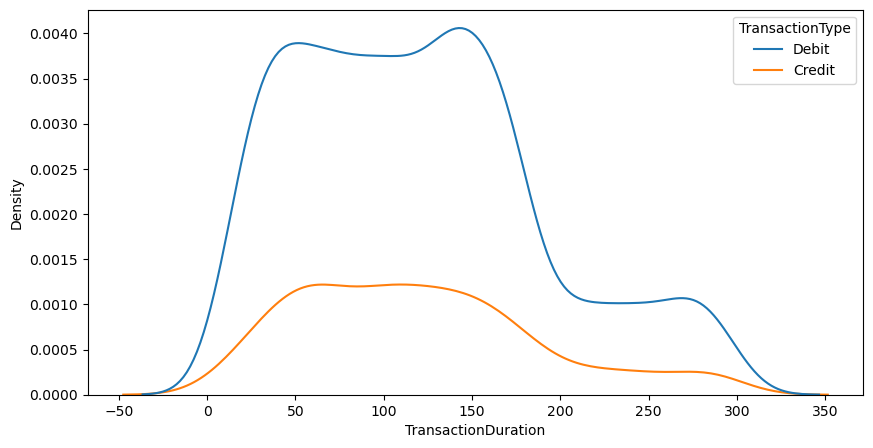

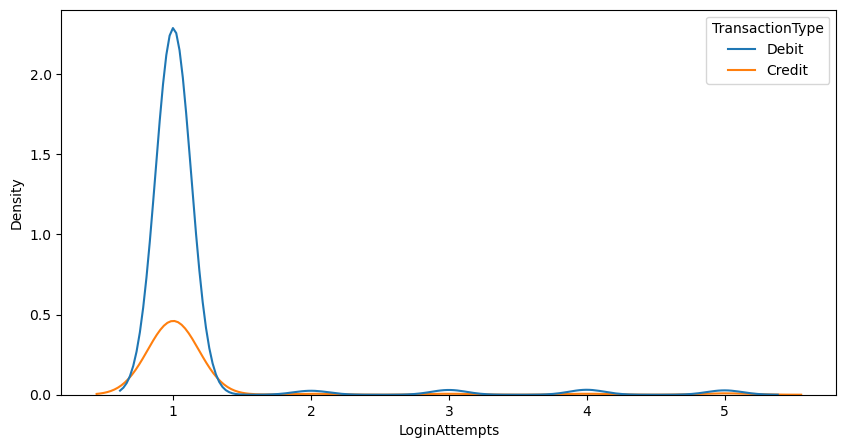

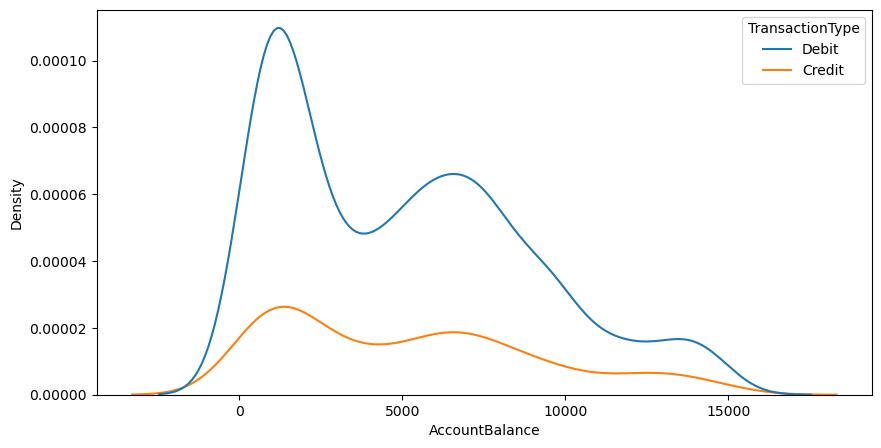

...

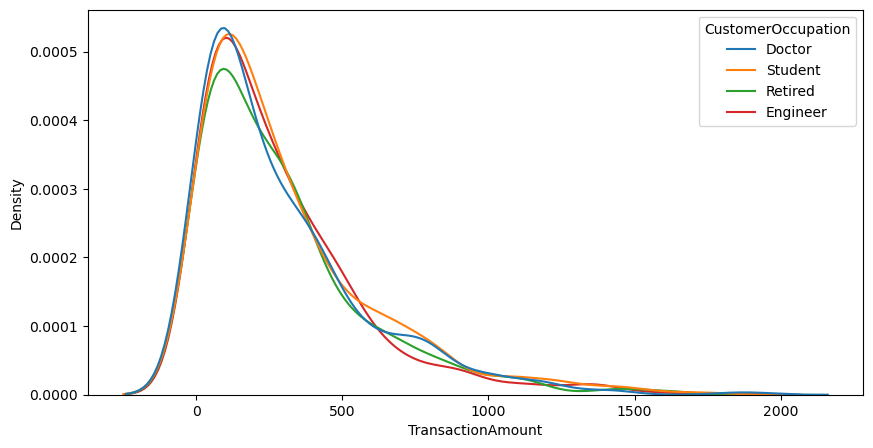

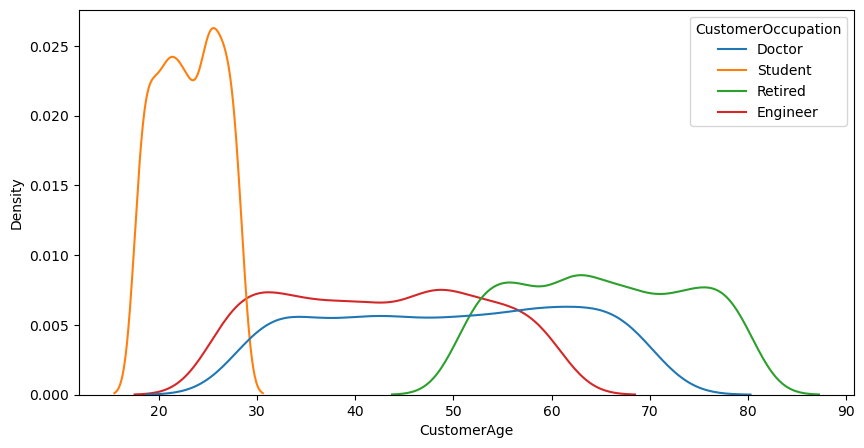

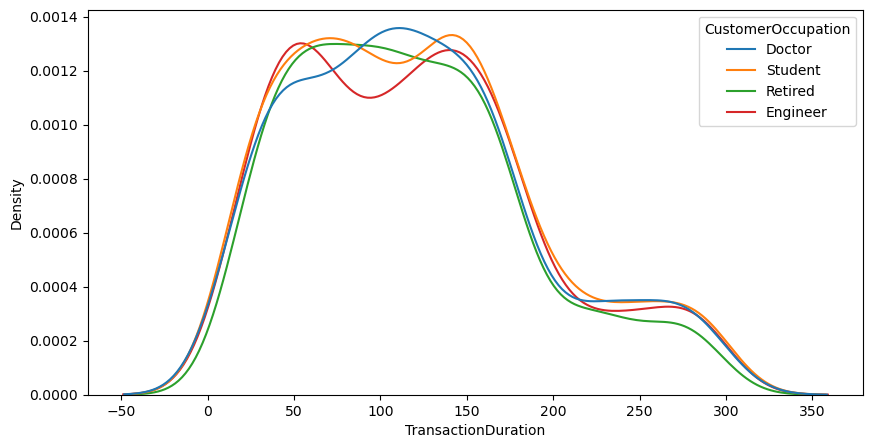

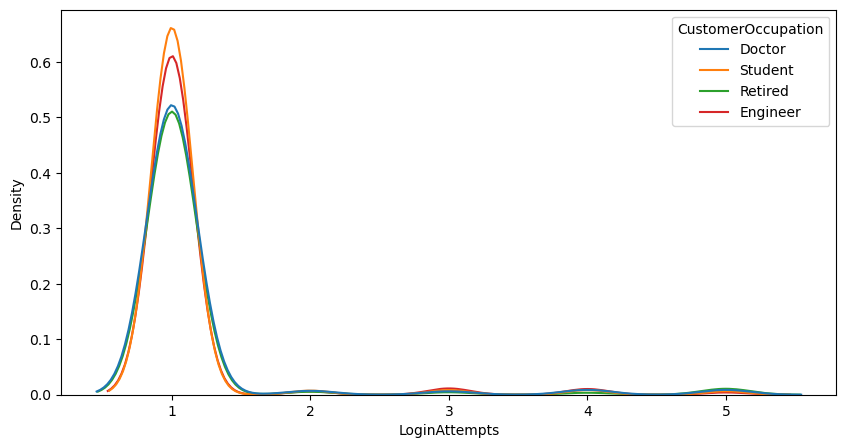

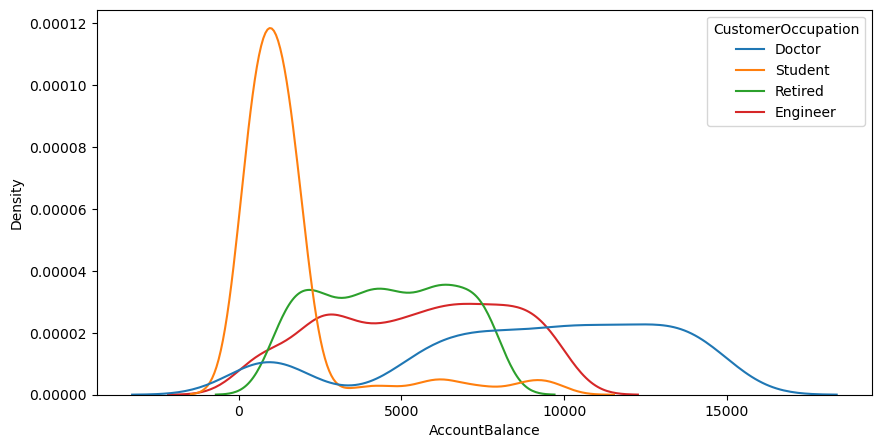

In [22]:
for cat in cat_col:
    for num in num_col:
        plt.figure(figsize = (10, 5))
        sns.kdeplot(data = df, x = num, hue = cat)
        plt.show()

## Multivariate Analysis

In [24]:
def bivariate_scatter(x, y, hue, df):
    plt.figure(figsize = (10,5))
    sns.scatterplot(x = x, y = y, data = df, hue = hue, alpha = 0.85)

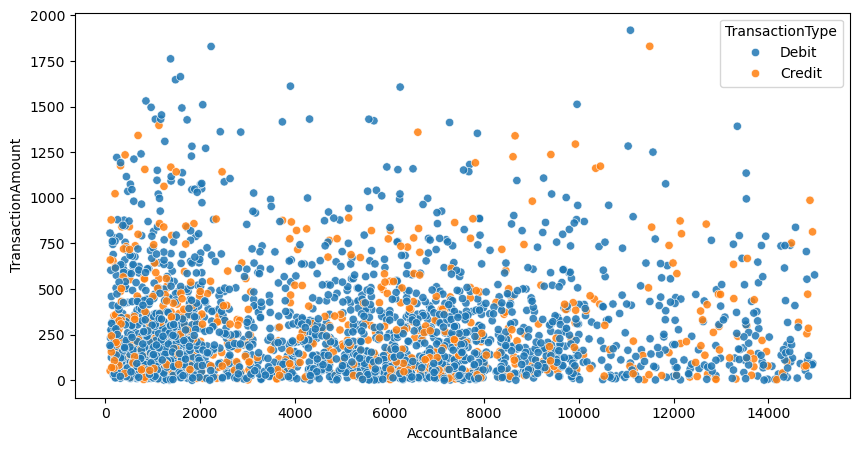

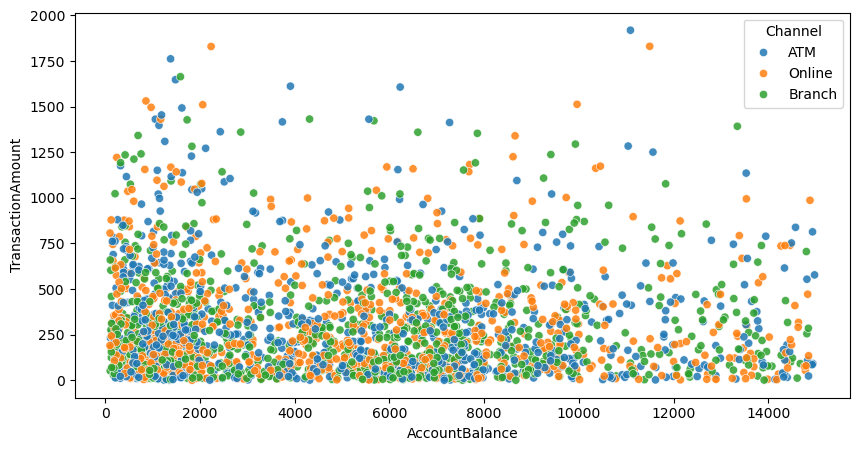

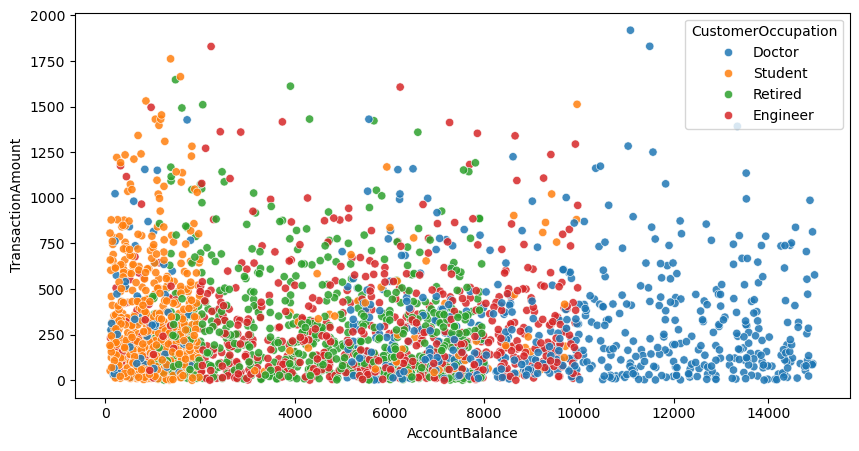

In [25]:
for cat in cat_col:
    bivariate_scatter('AccountBalance', 'TransactionAmount', cat, df)

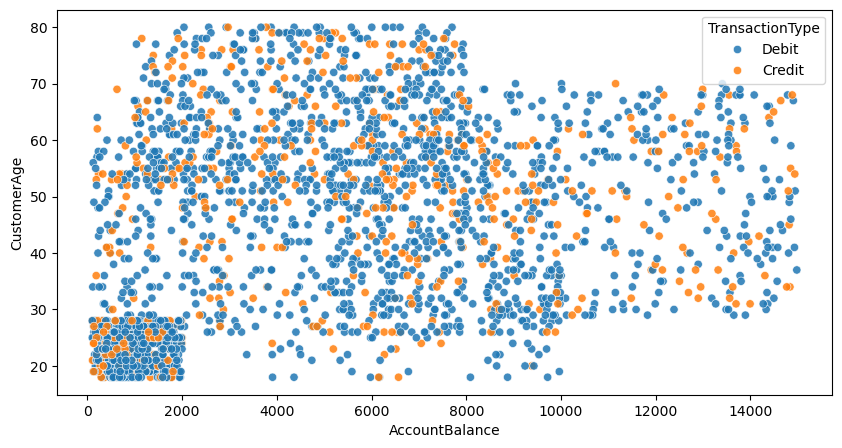

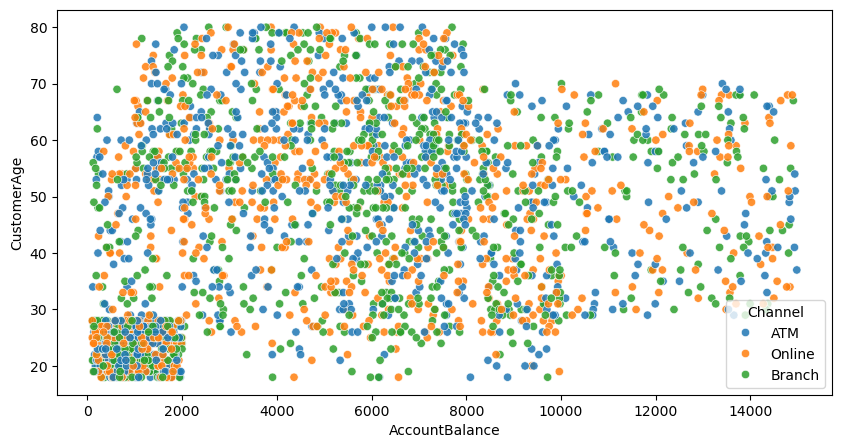

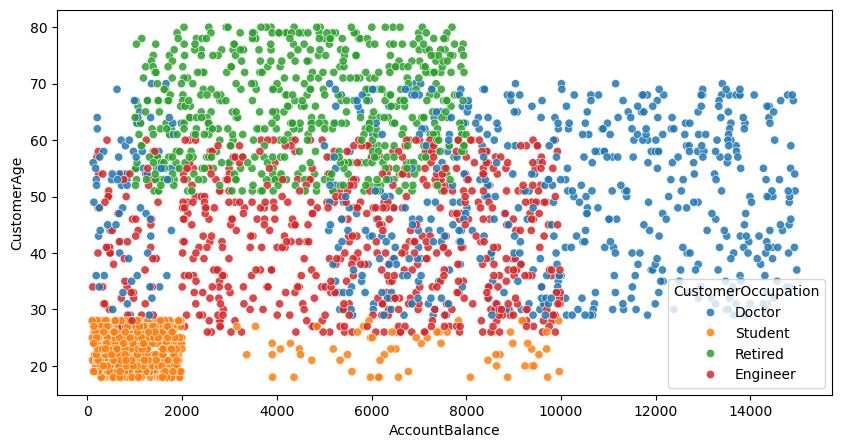

In [26]:
for cat in cat_col:
    bivariate_scatter('AccountBalance', 'CustomerAge', cat, df)

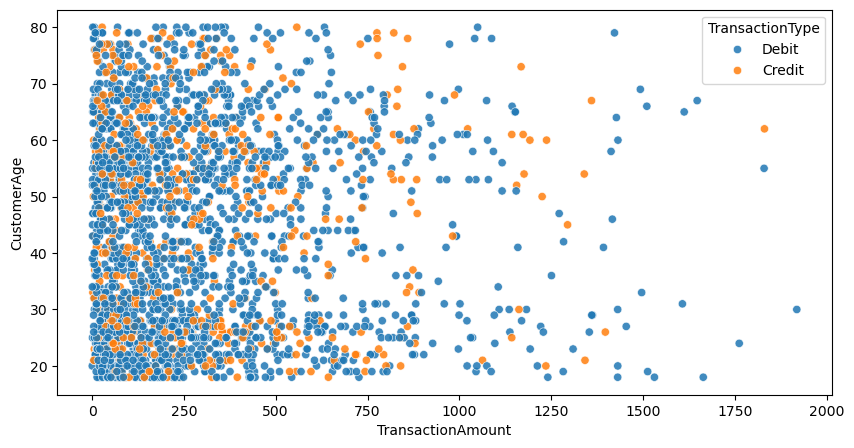

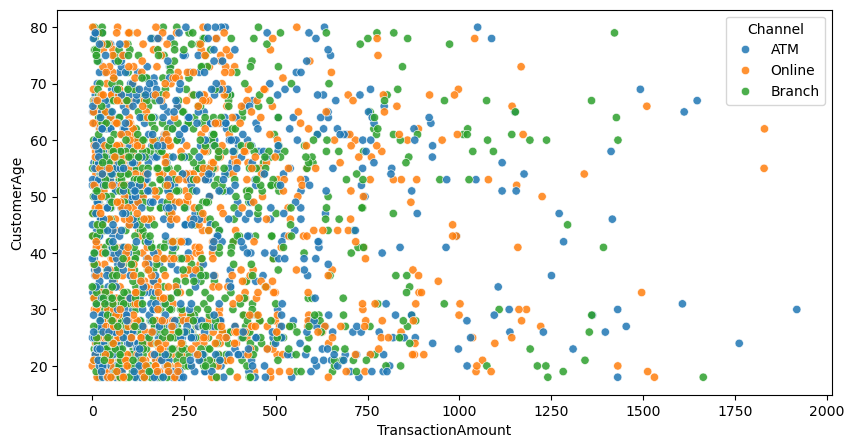

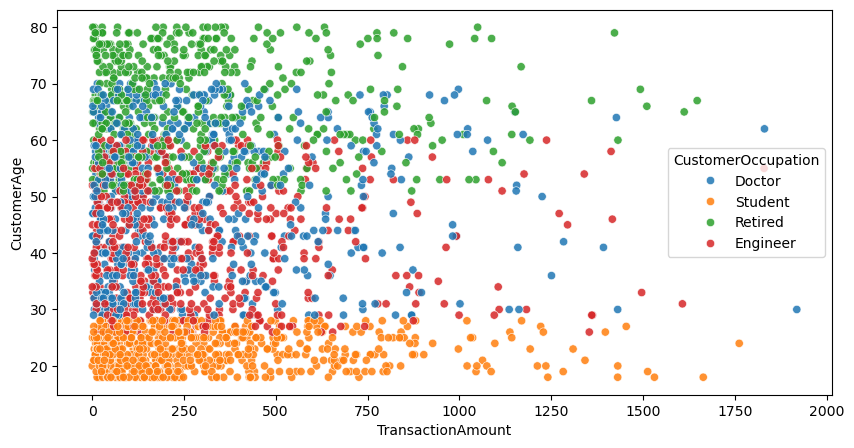

In [27]:
for cat in cat_col:
    bivariate_scatter('TransactionAmount', 'CustomerAge', cat, df)

## Correlation

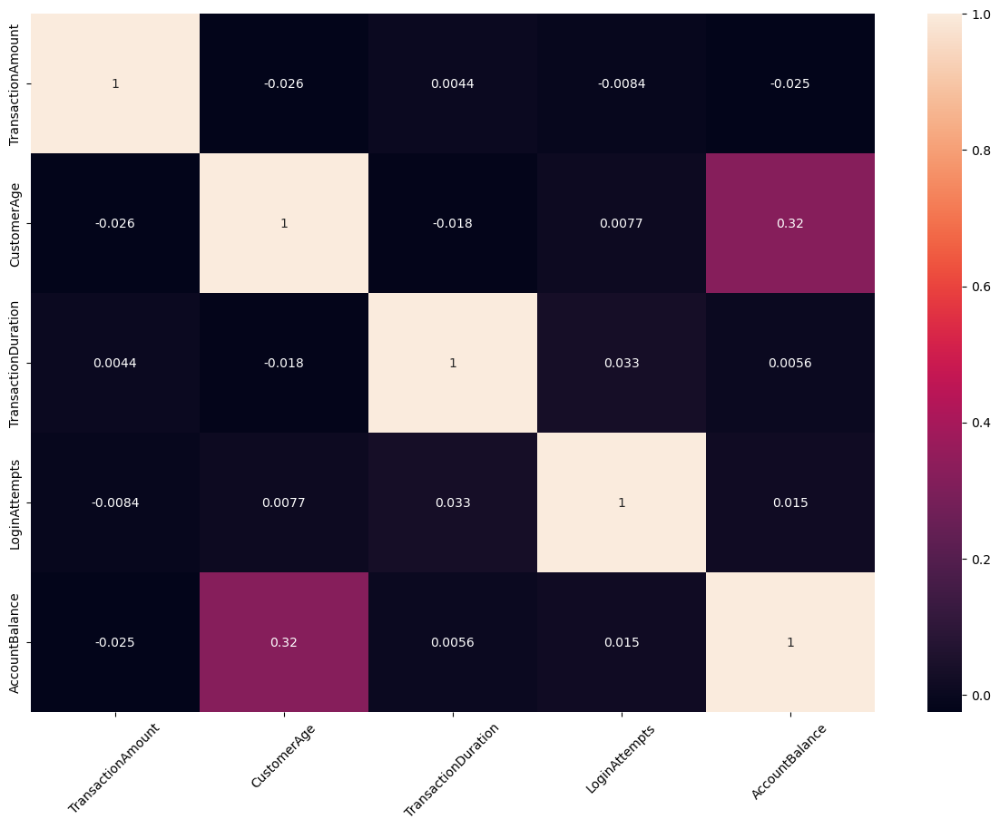

In [29]:
plt.figure(figsize = (15, 10))
sns.heatmap(df[num_col].corr(), annot = True)
plt.xticks(rotation=45)
plt.show()

## Outlier

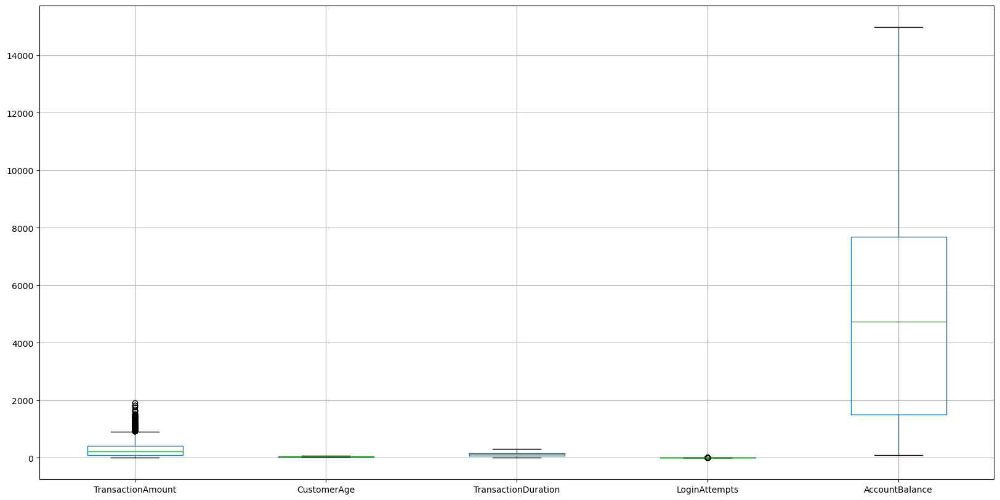

In [31]:
df.boxplot(figsize=(20, 10))
plt.show()

In [32]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
TransactionAmount,2512.0,297.593778,291.946243,0.26,81.885,211.14,414.5275,1919.11
CustomerAge,2512.0,44.673965,17.792198,18.00,27.000,45.00,59.0000,80.00
TransactionDuration,2512.0,119.643312,69.963757,10.00,63.000,112.50,161.0000,300.00
LoginAttempts,2512.0,1.124602,0.602662,1.00,1.000,1.00,1.0000,5.00
AccountBalance,2512.0,5114.302966,3900.942499,101.25,1504.370,4735.51,7678.8200,14977.99


# Data Pre-processing

In [34]:
df_cp = df.copy()
df_cp.head()

,TransactionAmount,TransactionType,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance
0,14.09,Debit,ATM,70,Doctor,81,1,5112.21
1,376.24,Debit,ATM,68,Doctor,141,1,13758.91
2,126.29,Debit,Online,19,Student,56,1,1122.35
3,184.50,Debit,Online,26,Student,25,1,8569.06
4,13.45,Credit,Online,26,Student,198,1,7429.40


## Drop Columns

In [36]:
df_cp.drop(['TransactionType', 'Channel'], axis = 1, inplace = True)
df_cp.head()

,TransactionAmount,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance
0,14.09,70,Doctor,81,1,5112.21
1,376.24,68,Doctor,141,1,13758.91
2,126.29,19,Student,56,1,1122.35
3,184.50,26,Student,25,1,8569.06
4,13.45,26,Student,198,1,7429.40


## One Hot Encoding

In [38]:
df_cp = pd.get_dummies(df_cp)
df_cp.head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student
0,14.09,70,81,1,5112.21,True,False,False,False
1,376.24,68,141,1,13758.91,True,False,False,False
2,126.29,19,56,1,1122.35,False,False,False,True
3,184.50,26,25,1,8569.06,False,False,False,True
4,13.45,26,198,1,7429.40,False,False,False,True


## Box Cox Transformation

In [40]:
# Check the skewness of all numerical features
skewed_feats = df_cp[num_col].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkewness in numerical features: \n")

skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness


Skewness in numerical features: 



,Skew
LoginAttempts,5.170401
TransactionAmount,1.739067
AccountBalance,0.600842
TransactionDuration,0.599074
CustomerAge,0.147776


In [41]:
skewness = skewness[abs(skewness['Skew']) > 0.75]

print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))

There are 2 skewed numerical features to Box Cox transform


In [42]:
skewed_features = skewness.index
lam = 0.20

for feat in skewed_features:
    df_cp[feat] = boxcox1p(df_cp[feat], lam)

In [43]:
df_cp.head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student
0,3.604148,70,81,0.743492,5112.21,True,False,False,False
1,11.379233,68,141,0.743492,13758.91,True,False,False,False
2,8.180408,19,56,0.743492,1122.35,False,False,False,True
3,9.211463,26,25,0.743492,8569.06,False,False,False,True
4,3.529893,26,198,0.743492,7429.40,False,False,False,True


In [44]:
# Check the skewness of all numerical features
skewed_feats = df_cp[num_col].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkewness in numerical features: \n")

skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness


Skewness in numerical features: 



,Skew
LoginAttempts,4.848181
AccountBalance,0.600842
TransactionDuration,0.599074
CustomerAge,0.147776
TransactionAmount,-0.177144


<Figure size 600x200 with 0 Axes>

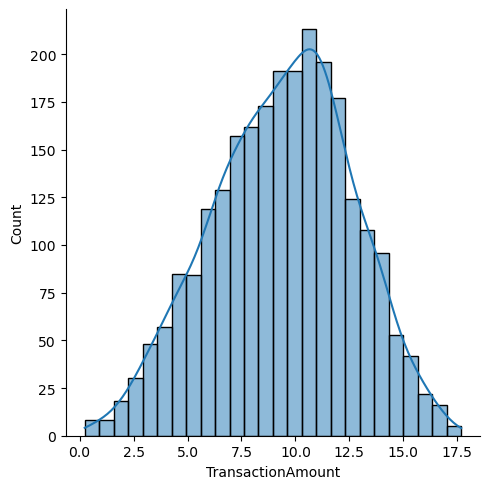

In [45]:
plt.figure(figsize = (6,2))
sns.displot(df_cp['TransactionAmount'], kde = True)
plt.show()

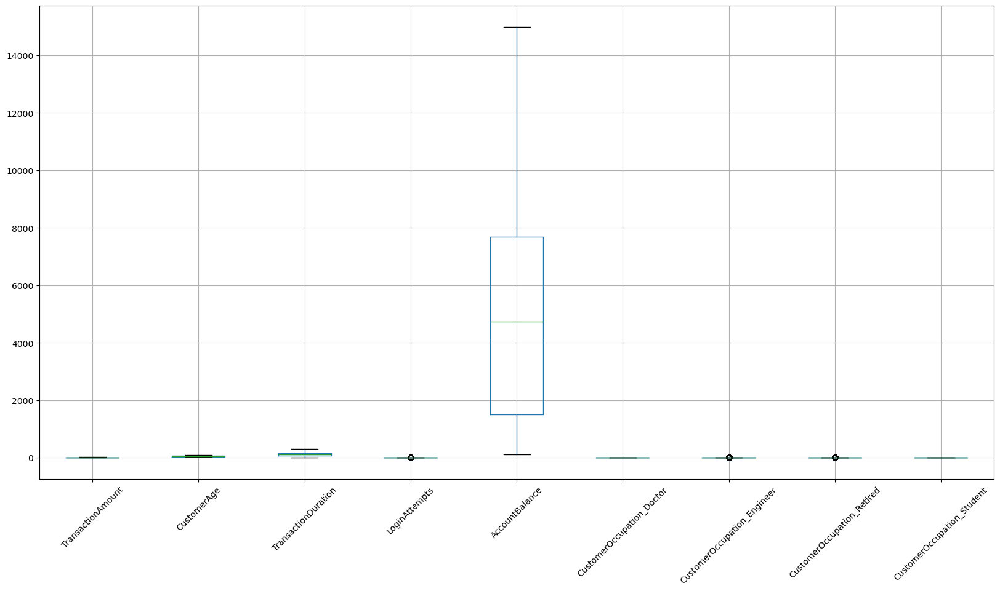

In [46]:
df_cp.boxplot(figsize=(20, 10))
plt.xticks(rotation=45)
plt.show()

## Scaling

In [48]:
scaler = MaxAbsScaler()

X = scaler.fit_transform(df_cp)
X

array([[0.20385921, 0.875     , 0.27      , ..., 0.        , 0.        ,
        0.        ],
       [0.64363663, 0.85      , 0.47      , ..., 0.        , 0.        ,
        0.        ],
       [0.46270347, 0.2375    , 0.18666667, ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.27417382, 0.7       , 0.48666667, ..., 0.        , 1.        ,
        0.        ],
       [0.52229237, 0.2875    , 0.06333333, ..., 0.        , 0.        ,
        1.        ],
       [0.56637676, 0.3       , 0.31      , ..., 0.        , 0.        ,
        1.        ]])

# Clustering

## Elbow Method

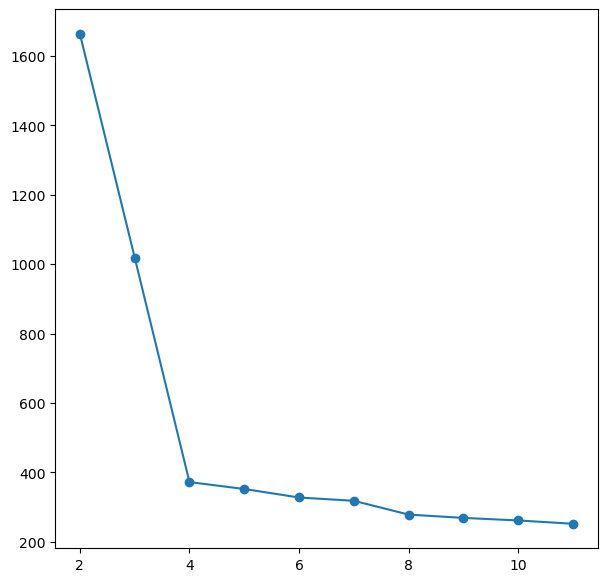

In [51]:
clusters_range = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
inertia = []

for c in clusters_range:
    kmeans = KMeans(n_clusters = c, random_state = 42).fit(X) # Training clustering into c clusters with Kmeans
    inertia.append(kmeans.inertia_)

plt.figure(figsize = (7, 7))
plt.plot(clusters_range, inertia, marker = 'o')

## Silhouette Score

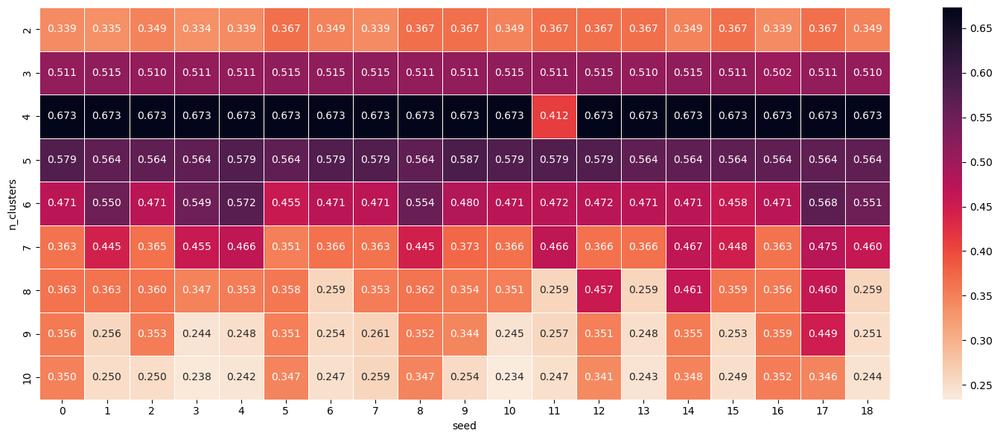

In [53]:
clusters_range=range(2, 11)
random_range  =range(0, 19)
results=[]

for c in clusters_range:
    for r in random_range:
        clusterer = KMeans(n_clusters = c, random_state = r)
        cluster_labels = clusterer.fit_predict(X)
        sillhouette_avg = silhouette_score(X, cluster_labels)
        results.append([c, r, sillhouette_avg])

result = pd.DataFrame(results, columns=["n_clusters","seed","silhouette_score"])
pivot_km = pd.pivot_table(result, index="n_clusters", columns="seed",values="silhouette_score")

plt.figure(figsize=(15, 6))
sns.heatmap(pivot_km, annot=True, linewidths=.5, fmt='.3f', cmap=sns.cm.rocket_r)
plt.tight_layout()

## Dimentional Reduction

In [55]:
pca = PCA(n_components=3, random_state=42)

X_pca = pca.fit_transform(X)

X_pca_df = pd.DataFrame(data=X_pca, columns=['X1', 'X2', 'X3'])
X_pca_df

,X1,X2,X3
0,-0.561926,-0.544817,-0.315160
1,-0.731954,-0.655253,-0.303986
2,0.906155,-0.136955,-0.237469
3,0.721425,-0.207852,-0.233693
4,0.743350,-0.200478,-0.232765
...,...,...,...
2507,-0.575381,-0.726663,-0.281377
2508,-0.369194,-0.543773,-0.305946
2509,-0.262761,0.784668,-0.322306
2510,0.877506,-0.133693,-0.239955


## K-Means

In [57]:
kmeans = KMeans(n_clusters=4, random_state=42).fit(X)
labels = kmeans.labels_

X_pca_df['Cluster'] = labels
X_pca_df['Cluster'] = X_pca_df['Cluster'].astype(str)
X_pca_df

,X1,X2,X3,Cluster
0,-0.561926,-0.544817,-0.315160,3
1,-0.731954,-0.655253,-0.303986,3
2,0.906155,-0.136955,-0.237469,1
3,0.721425,-0.207852,-0.233693,1
4,0.743350,-0.200478,-0.232765,1
...,...,...,...,...
2507,-0.575381,-0.726663,-0.281377,3
2508,-0.369194,-0.543773,-0.305946,3
2509,-0.262761,0.784668,-0.322306,2
2510,0.877506,-0.133693,-0.239955,1


In [58]:
X_pca_df['Cluster'].value_counts()

Cluster
1    657
3    631
0    625
2    599
Name: count, dtype: int64

## Visualization of clustering results

In [60]:
fig = px.scatter_3d(X_pca_df, x='X1', y='X2', z='X3',
              color=X_pca_df['Cluster'])
fig.show()

# New Dataset

In [62]:
results_df = df_cp.copy()

results_df['Cluster'] = kmeans.labels_
results_df['DistanceToCentroid'] = np.linalg.norm(X - kmeans.cluster_centers_[kmeans.labels_], axis=1)

results_df.head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student,Cluster,DistanceToCentroid
0,3.604148,70,81,0.743492,5112.21,True,False,False,False,3,0.502841
1,11.379233,68,141,0.743492,13758.91,True,False,False,False,3,0.417496
2,8.180408,19,56,0.743492,1122.35,False,False,False,True,1,0.237971
3,9.211463,26,25,0.743492,8569.06,False,False,False,True,1,0.567615
4,3.529893,26,198,0.743492,7429.40,False,False,False,True,1,0.581851


In [63]:
# Identify potential frauds based on distance threshold
threshold = results_df['DistanceToCentroid'].quantile(0.95)

# Use .apply to create the 'Fraud' column based on the condition
results_df['Fraud'] = results_df['DistanceToCentroid'].apply(lambda x: 'Fraud' if x > threshold else 'Not Fraud')

results_df.head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student,Cluster,DistanceToCentroid,Fraud
0,3.604148,70,81,0.743492,5112.21,True,False,False,False,3,0.502841,Not Fraud
1,11.379233,68,141,0.743492,13758.91,True,False,False,False,3,0.417496,Not Fraud
2,8.180408,19,56,0.743492,1122.35,False,False,False,True,1,0.237971,Not Fraud
3,9.211463,26,25,0.743492,8569.06,False,False,False,True,1,0.567615,Not Fraud
4,3.529893,26,198,0.743492,7429.40,False,False,False,True,1,0.581851,Not Fraud


# Exploratory New Dataset Analysis (EDA)

In [65]:
threshold

0.62601663802812

In [66]:
results_df[results_df['Fraud'] == 'Fraud'].head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student,Cluster,DistanceToCentroid,Fraud
25,2.669226,65,276,0.743492,3634.67,False,False,True,False,2,0.652921,Fraud
26,10.060376,23,158,2.154845,673.35,False,False,False,True,1,0.650636,Fraud
73,9.898893,26,280,0.743492,6537.62,False,False,False,True,1,0.627825,Fraud
140,2.378866,30,246,0.743492,5442.76,True,False,False,False,3,0.665935,Fraud
146,14.802343,77,296,0.743492,2042.22,False,False,True,False,2,0.707540,Fraud


## Composition 

In [68]:
label = results_df['Fraud']

label_counts = label.value_counts().sort_values(ascending=False)
label_counts

Fraud
Not Fraud    2386
Fraud         126
Name: count, dtype: int64

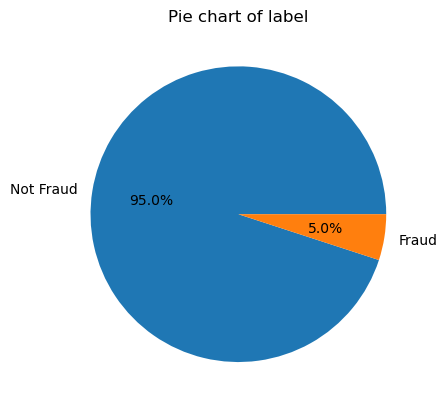

In [69]:
# create a pie chart
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%')

# add title
plt.title('Pie chart of label')

# show the plot
plt.show()

# New Data Pre-processing

In [71]:
df_2 = results_df.copy()
df_2.drop(columns = ['Cluster', 'DistanceToCentroid'], inplace=True)

df_2.head()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance,CustomerOccupation_Doctor,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student,Fraud
0,3.604148,70,81,0.743492,5112.21,True,False,False,False,Not Fraud
1,11.379233,68,141,0.743492,13758.91,True,False,False,False,Not Fraud
2,8.180408,19,56,0.743492,1122.35,False,False,False,True,Not Fraud
3,9.211463,26,25,0.743492,8569.06,False,False,False,True,Not Fraud
4,3.529893,26,198,0.743492,7429.40,False,False,False,True,Not Fraud


## Oversampling

In [73]:
X = df_2.drop('Fraud', axis=1)
y = df_2['Fraud']

smote = SMOTE(sampling_strategy='minority', random_state=42)

X,y = smote.fit_resample(X,y)
y.value_counts()

Fraud
Not Fraud    2386
Fraud        2386
Name: count, dtype: int64

## Split Data

In [75]:
# Splitting the testing and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3817, 9)
(955, 9)
(3817,)
(955,)


## Scaling

In [77]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [78]:
X_train

array([[-0.41157492, -0.64413819,  0.32627301, ..., -0.58491347,
        -0.58168638, -0.57442594],
       [ 0.11420025,  2.07598545,  1.57773564, ..., -0.58491347,
         1.71913944, -0.57442594],
       [ 0.46747311, -0.32784475, -0.47227933, ..., -0.58491347,
        -0.58168638, -0.57442594],
       ...,
       [ 0.07982313, -0.96043164, -0.32925503, ..., -0.58491347,
         1.71913944,  1.74086847],
       [-0.33814249,  0.81081166, -0.6510597 , ..., -0.58491347,
         1.71913944, -0.57442594],
       [ 0.18899647, -1.59301853,  1.75651601, ..., -0.58491347,
        -0.58168638,  1.74086847]])

In [79]:
pickle.dump(scaler, open('scaler.pkl', 'wb'))

# Classification

In [81]:
def classification_eval(actual, predict, name):

  cm = confusion_matrix(actual, predict)
  # plot confusion matrix
  plt.figure(figsize=(8,6))
  sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
              xticklabels=['Not Fraud', 'Fraud'],
              yticklabels=['Not Fraud', 'Fraud'])
  plt.xlabel('Predicted Labels')
  plt.ylabel('Actual Lables')
  plt.title(f'Confusion Matrix - {name}')
  plt.show()

  print(classification_report(actual, predict))

In [82]:
models = {
    # 'Naive Bayes': MultinomialNB(),
    'Logistic Regression': LogisticRegression(),
    'K-NN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Bagging Classifier': BaggingClassifier(),
    'Ada Boost Classifier': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Machine': SVC()
}

results = []

for model_name, model in models.items():
    model.fit(X_train, y_train)
    
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    accuracy_train = accuracy_score(y_train, y_pred_train)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    
    results.append({'Model': model_name, 'Train Accuracy': accuracy_train, 'Test Accuracy': accuracy_test})

df_accuracy = pd.DataFrame(results).sort_values(by=['Train Accuracy', 'Test Accuracy'], ascending=[False, False])
df_accuracy

,Model,Train Accuracy,Test Accuracy
6,Random Forest,1.000000,0.991623
2,Decision Tree,1.000000,0.974869
3,Bagging Classifier,0.997642,0.986387
5,Gradient Boosting,0.985853,0.986387
1,K-NN,0.983757,0.981152
7,Support Vector Machine,0.976683,0.980105
4,Ada Boost Classifier,0.959916,0.961257
0,Logistic Regression,0.932408,0.928796


# Model Tuning

In [84]:
rf = RandomForestClassifier(random_state=42)

# define parameters for GridSearchCV
parameters = {'n_estimators': [10, 100],
              'criterion': ['gini', 'entropy', 'log_loss'],
              'max_features': ['sqrt', 'log2', None]}

grid_search = GridSearchCV(estimator=rf, param_grid=parameters, cv=5, verbose=2)

grid_search.fit(X_train, y_train)

# Best parameters
print(f"Best Parameters found: {grid_search.best_params_}")

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[CV] END .criterion=gini, max_features=sqrt, n_estimators=10; total time=   0.0s
[CV] END .criterion=gini, max_features=sqrt, n_estimators=10; total time=   0.0s
[CV] END .criterion=gini, max_features=sqrt, n_estimators=10; total time=   0.0s
[CV] END .criterion=gini, max_features=sqrt, n_estimators=10; total time=   0.0s
[CV] END .criterion=gini, max_features=sqrt, n_estimators=10; total time=   0.0s
[CV] END criterion=gini, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=gini, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=gini, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=gini, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END criterion=gini, max_features=sqrt, n_estimators=100; total time=   0.2s
[CV] END .criterion=gini, max_features=log2, n_estimators=10; total time=   0.0s
[CV] END .criterion=gini, max_features=log2, n_e

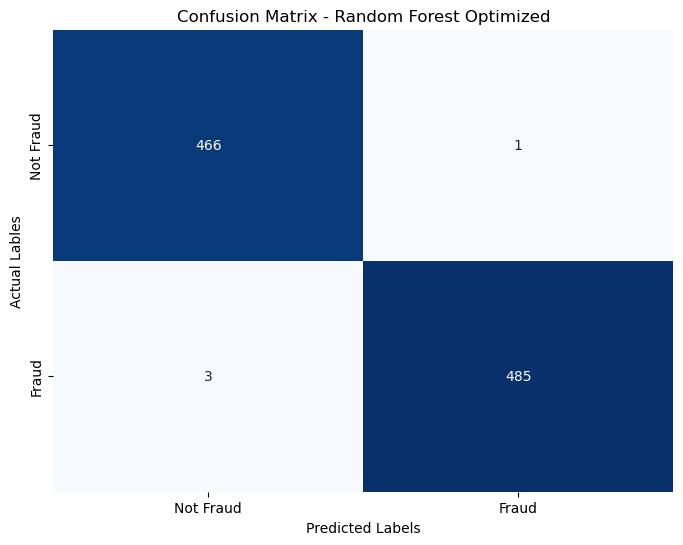

              precision    recall  f1-score   support

       Fraud       0.99      1.00      1.00       467
   Not Fraud       1.00      0.99      1.00       488

    accuracy                           1.00       955
   macro avg       1.00      1.00      1.00       955
weighted avg       1.00      1.00      1.00       955



In [85]:
rf = RandomForestClassifier(random_state=42, criterion='entropy', max_features=None, n_estimators=100)

model_rf = rf.fit(X_train, y_train)

y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)

classification_eval(y_test, y_pred_test, 'Random Forest Optimized')

In [86]:
pickle.dump(model_rf, open('model_rf.pkl', 'wb'))